# Install detectron2

In [1]:
# !conda create -n myenv python=3.9 -y
#!source /root/anaconda3/etc/profile.d/conda.sh
#!conda activate myenv

In [2]:
#!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
#!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Nov_18_09:45:30_PST_2021
Cuda compilation tools, release 11.5, V11.5.119
Build cuda_11.5.r11.5/compiler.30672275_0
torch:  1.9 ; cuda:  cu111
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model

# Train on a custom dataset

In [5]:
import json
  
# Opening JSON file
f = open('/root/labelstudio/result.json')
  
dataset_dicts = json.load(f)

In [6]:
dataset_dicts.keys()

dict_keys(['images', 'categories', 'annotations', 'info'])

In [7]:
dataset_dicts['categories']

[{'id': 0, 'name': 'Bundle'}]

In [8]:
a = 'images/2/64d16c58-IMG_0306.JPG'


In [9]:
dataset_dicts['images'][0]

{'width': 3024, 'height': 4032, 'id': 0, 'file_name': '82e70341-IMG_0331.JPG'}

In [10]:
!ls /root/labelstudio/images

0085c7f5-IMG_0345.JPG  51537c0e-IMG_0338.JPG   991068d7-IMG_0322.JPG
00f6131a-IMG_0334.JPG  521f6667-IMG_E0297.JPG  9ab8ffff-IMG_0301.JPG
026e8489-IMG_0309.JPG  59b6b761-IMG_0319.JPG   9e66eb06-IMG_0350.JPG
07718b07-IMG_0336.JPG  5ce6272c-IMG_0298.JPG   a3582be5-IMG_0340.JPG
084d3a58-IMG_0337.JPG  604af086-IMG_0339.JPG   b3151cf3-IMG_0346.JPG
0b6e259b-IMG_0311.JPG  64d16c58-IMG_0306.JPG   b85cd6e3-IMG_0308.JPG
0e216299-IMG_0349.JPG  65266110-IMG_0347.JPG   b9799882-IMG_0332.JPG
0f769699-IMG_0354.JPG  677d6212-IMG_0323.JPG   bb3483c5-IMG_0335.JPG
122478f8-IMG_0353.JPG  6f0fd4cc-IMG_0348.JPG   c17bf3e5-IMG_0316.JPG
1a2c184f-IMG_0352.JPG  785d78b4-IMG_0342.JPG   ca4491cd-IMG_0302.JPG
1dd8d0a8-IMG_0355.JPG  7e6286d9-IMG_0300.JPG   ce5958f1-IMG_0359.JPG
1ea3cfcf-IMG_0320.JPG  82e70341-IMG_0331.JPG   d62825b3-IMG_0344.JPG
21d68f79-IMG_0333.JPG  84699595-IMG_0321.JPG   e41a0695-IMG_0299.JPG
2a34357f-IMG_0312.JPG  84e5918a-IMG_0295.JPG   ea30c502-IMG_0326.JPG
30e43cf0-IMG_0303.JPG  90798fb9-IM

In [11]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train1", {}, "/root/labelstudio/result.json", "/root/labelstudio/images/")

In [12]:
#register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

In [13]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

<!-- To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set: -->



## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [14]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train1",)
cfg.DATASETS.TEST = ("my_dataset_train1")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

In [15]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [16]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

[11/21 05:57:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

2022-11-21 05:57:36.211788: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-21 05:57:37.440083: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-21 05:57:39.636526: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-11-21 05:57:39.636795: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dl

In [17]:
#trainer.train()

In [18]:
# Look at training curves in tensorboard:
#%load_ext tensorboard
#%tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [19]:
cfg.OUTPUT_DIR

'./output'

In [20]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[11/21 05:57:46 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

In [26]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv, hsv2rgb

In [27]:
%%time
#-- 5-10 seconds ## Loading to prediction to output

im = imread("/root/labelstudio/images/"+dataset_dicts['images'][10]['file_name'])
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

/root/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


CPU times: user 1.5 s, sys: 500 ms, total: 2 s
Wall time: 1.84 s


In [28]:
outputs

{'instances': Instances(num_instances=1, image_height=4032, image_width=3024, fields=[pred_boxes: Boxes(tensor([[ 894.9878, 1849.7740, 1232.9169, 2392.6677]], device='cuda:0')), scores: tensor([0.9980], device='cuda:0'), pred_classes: tensor([0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]], device='cuda:0')])}

In [29]:
def get_region(im):
    outputs = predictor(im)
    max_index = outputs['instances'].scores.tolist().index(max(outputs['instances'].scores.tolist()))
    x1 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][0]
    y1 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][1]
    x2 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][2]
    y2 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][3]
    imshow(im[int(y1):int(y2),int(x1):int(x2),:])
    return im[int(y1):int(y2),int(x1):int(x2),:]

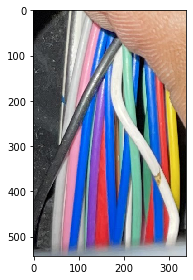

In [30]:
im1 = get_region(im)

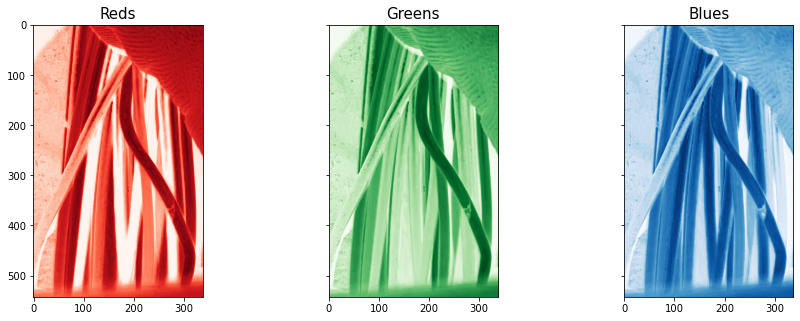

In [31]:
def rgb_splitter(image):
    rgb_list = ['Reds','Greens','Blues']
    fig, ax = plt.subplots(1, 3, figsize=(15,5), sharey = True)
    for i in range(3):
        ax[i].imshow(image[:,:,i], cmap = rgb_list[i])
        ax[i].set_title(rgb_list[i], fontsize = 15)
rgb_splitter(im1)

In [32]:
import numpy as np
import cv2

original = im1.copy()
image = cv2.cvtColor(im1, cv2.COLOR_BGR2HSV)
lower = np.array([90, 90, 0], dtype="uint8")
upper = np.array([255, 255, 80], dtype="uint8")
mask = cv2.inRange(im1, lower, upper)

cnts = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(original, (x, y), (x + w, y + h), (36,255,12), 2)

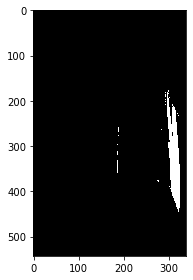

In [33]:
imshow(mask)

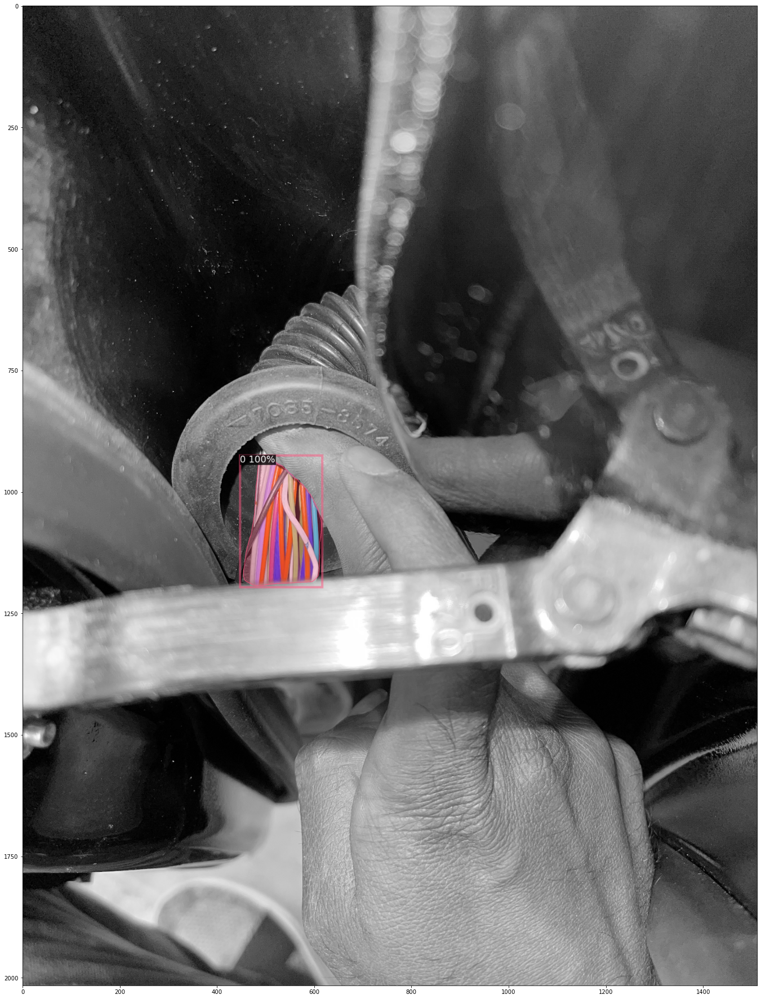

In [34]:
plt.figure(figsize=(40, 32))
plt.imshow(out.get_image())

In [35]:
out.

SyntaxError: invalid syntax (988858502.py, line 1)

In [36]:
%%time
#-- 5-10 seconds ## Loading to prediction to output

im = cv2.imread("/root/labelstudio/images/"+dataset_dicts['images'][19]['file_name'])
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

CPU times: user 1.15 s, sys: 350 ms, total: 1.5 s
Wall time: 1.36 s


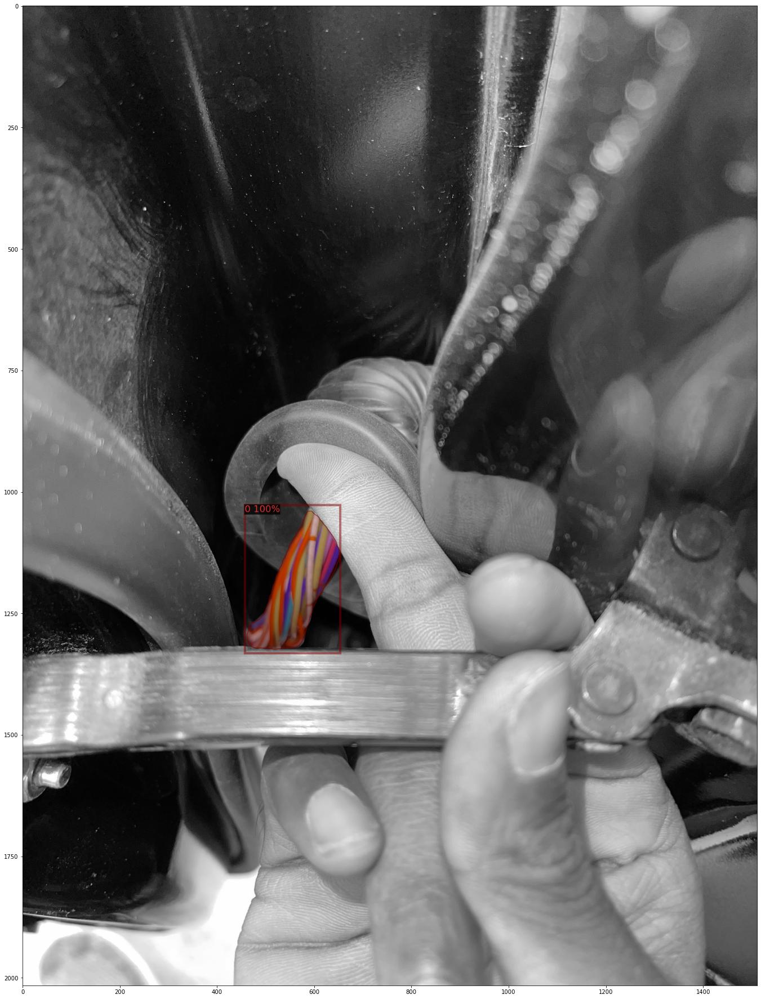

In [37]:
im1 =cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(40, 32))
plt.imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [38]:
!ls ./output/

coco_instances_results.json
events.out.tfevents.1661234203.ip-172-31-85-208.3274.0
events.out.tfevents.1661235470.ip-172-31-85-208.3407.0
events.out.tfevents.1662100369.ip-172-31-85-208.36184.0
events.out.tfevents.1662100502.ip-172-31-85-208.36184.1
events.out.tfevents.1662101071.ip-172-31-85-208.36184.2
events.out.tfevents.1668543990.ip-10-0-1-131.4617.0
events.out.tfevents.1669010262.ip-10-0-1-131.1584.0
instances_predictions.pth
last_checkpoint
metrics.json
model_final.pth
my_dataset_train1_coco_format.json.lock


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_train1", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_train1")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`